In [1]:
import numpy as np
import requests
import json
from matplotlib import pyplot as plt
from datetime import datetime
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
import pickle as pkl
import tabulate
from scipy import stats
from pprint import pprint

DIR = "trials/imagenet-sample-images-master/"

## Helper Functions

1. **print_json          :**   Function to print the structure of the json(keys only)
2. **process_image       :**   Function to prepare image for the network
3. **process_image_array :**   Function to prepare image in ndarray format for the network
4. **xai_request         :** Function to call the XAI api
5. **output_normalize    :** Function to normalize the XAI output for plotting
6. **contrast_difference :** Function to provide the positive and negative components of the difference between the postive and negative components of XAI contrast output


In [2]:
def print_json(d, m):
    for k in d.keys():
        if isinstance(d[k],dict):
            print("\t"*m, k)
            print_json(d[k],m+1)
        else:
            if isinstance(d[k],list):
                print("\t"*m, k, "-->", type(d[k]),"\t",np.array(d[k]).shape,"\n")
            else:
                print("\t"*m, k, "-->", type(d[k]),"\n")
                
def process_image(img):
    tmp_img = image.img_to_array(img)
    tmp_img = np.expand_dims(tmp_img, axis=0)
    tmp_img = preprocess_input(tmp_img)
    return tmp_img

def process_image_array(img_array):
    tmp_img = np.expand_dims(img_array, axis=0)
    tmp_img = preprocess_input(tmp_img)
    return tmp_img

def xai_request(data ,multi_input, mode , scaler, predictions):
    url = "https://xai.arya.ai/api/v1/explainability"
    payload = json.dumps({
      "data": data,
      "is_multi_input": multi_input,
      "mode": mode,
      "token": "1635233779352",
      "scaler": scaler,
      "predictions": predictions
    })
    headers = {
      'Content-Type': 'application/json'
    }
    response = requests.request("POST", url, headers=headers, data=payload)
    return response

def output_normalize(arg,max_val=1.0):
    arg_max = np.max(arg)
    arg_min = np.abs(np.min(arg))
    if arg_max>arg_min:
        return (arg/arg_max)*max_val
    elif arg_min>0:
        return (arg/arg_min)*max_val
    else:
        return arg
    
def contrast_difference(arg):
    pos = np.array(arg["positive"])
    neg = np.array(arg["negative"])
    diff = pos-neg
    pos_out = np.abs(np.clip(diff,0,None))
    neg_out = np.abs(np.clip(diff,None,0))
    return {"pos":pos_out,"neg":neg_out}

## Samples

In [3]:
images = [
    "n02120505_grey_fox",
    "n02835271_bicycle-built-for-two",
    "n02980441_castle"
]
image_paths = [f"{DIR}{img}.JPEG" for img in images]
print(*images,sep="\n")

n02120505_grey_fox
n02835271_bicycle-built-for-two
n02980441_castle


### Load images

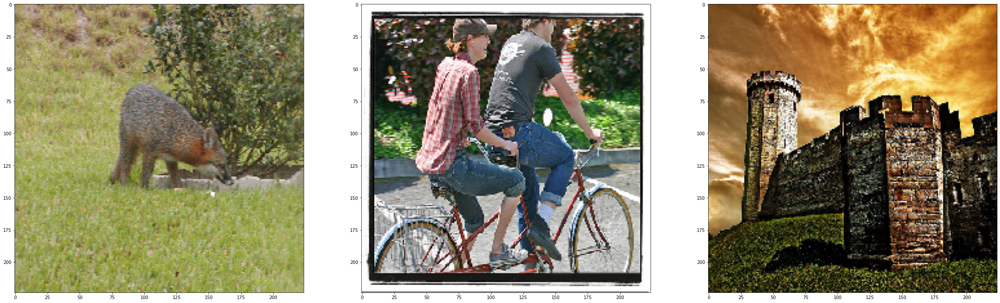

In [4]:
input_images = []
for file_path in image_paths:
    img = image.load_img(file_path, target_size=(224, 224))
    input_images.append(img)

fig, axs = plt.subplots(1, 3, figsize=(40,40))
for idx, img in enumerate(input_images):
    axs[idx].imshow(img,cmap="gray")
plt.show()

## Network   

In [5]:
model = tf.keras.models.load_model("trials/resnet50.h5")

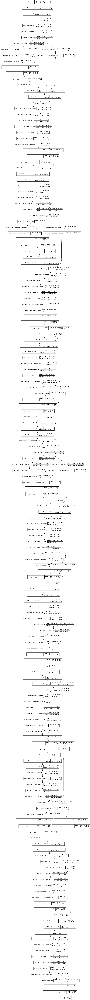

In [6]:
tf.keras.utils.plot_model(
    model,
    to_file="model.png",
    show_shapes=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
)

<!--
def xai_request(*args):
    return True
-->

# XAI 

## Default Mode

In [8]:
is_multi_input = False
mode = "default"
scaler = 1.0
predictions = True

results_default = []
for img in input_images:
    tmp_img = process_image(img)
    data = np.array(tmp_img[0]).tolist()
    output = xai_request(data ,is_multi_input, mode , scaler, predictions)
    results_default.append(output)

<!--  
results_default = [pkl.load(open(f"trials/imagenet_output/{f}.default","rb")) for f in images]
-->

### Output Structure

In [10]:
print_json(results_default[0],0)

 success --> <class 'bool'> 

 data
	 input_1 --> <class 'list'> 	 (224, 224, 3) 

 network_output
	 predictions/Softmax:0 --> <class 'list'> 	 (1, 1000) 



### Output Plots

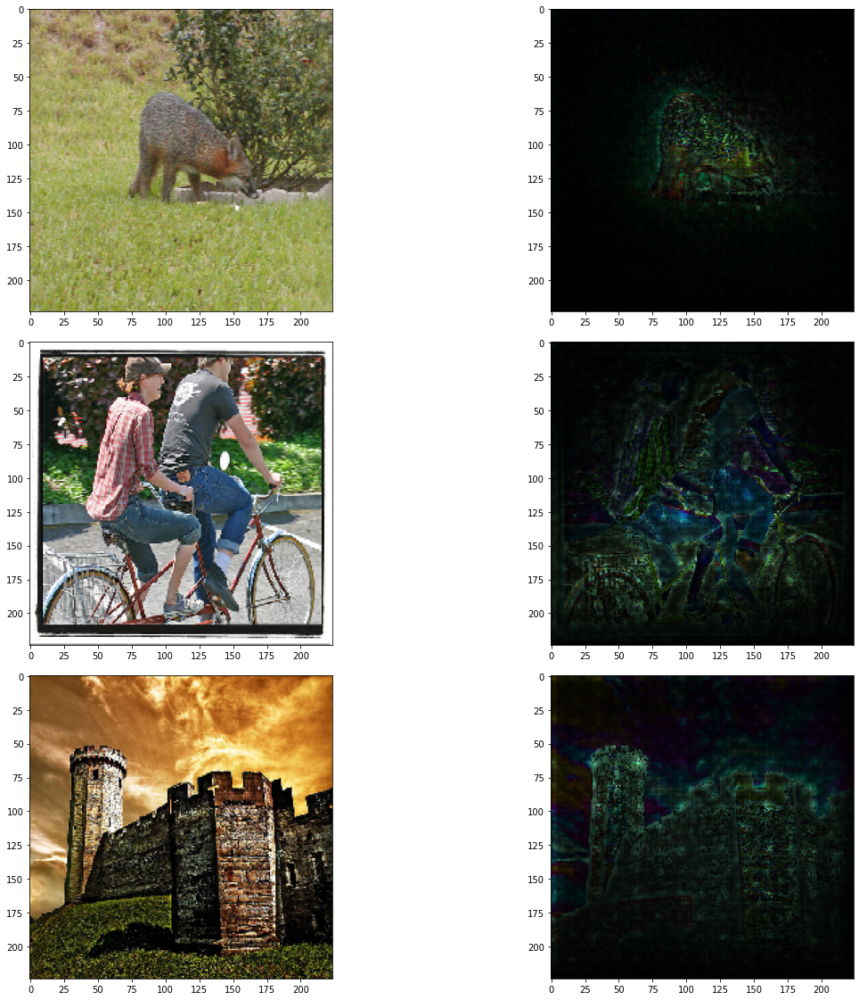

In [11]:
# fig, axs = plt.subplots(2, 3, figsize=(40,40), sharex=True, sharey=True)
fig = plt.figure(figsize=(20,20))
gs = fig.add_gridspec(3, 2, hspace=0.1, wspace=0.1)
# axs = gs.subplots(sharex='col', sharey='row')
axs = gs.subplots()
for idx, tmp_output in enumerate(results_default):
    axs[idx, 0].imshow(input_images[idx])
    axs[idx, 1].imshow(output_normalize(tmp_output["data"]["input_1"]))
plt.show()

## Contrast Mode

In [12]:
is_multi_input = False
mode = "contrast"
scaler = None
predictions = True

results = []
for img in input_images:
    tmp_img = process_image(img)
    output = xai_request(data ,is_multi_input, mode , scaler, predictions)
    results.append(output)

<!--
results = [pkl.load(open(f"trials/imagenet_output/{f}.contrast","rb")) for f in images]
  -->

### Output Structure

In [14]:
print_json(results[0],0)

 success --> <class 'bool'> 

 data
	 input_1
		 positive --> <class 'list'> 	 (224, 224, 3) 

		 negative --> <class 'list'> 	 (224, 224, 3) 

 network_output
	 predictions/Softmax:0 --> <class 'list'> 	 (1, 1000) 



### Output Plots

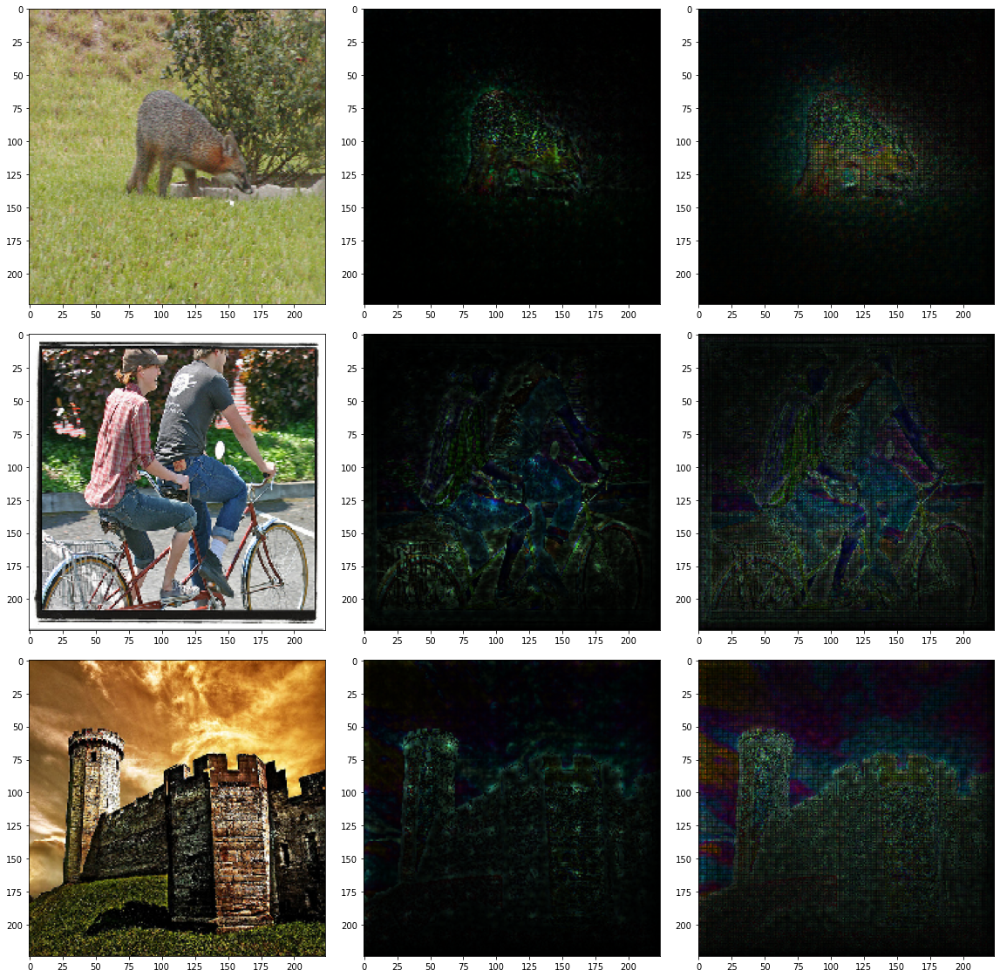

In [15]:
# fig, axs = plt.subplots(2, 3, figsize=(40,40), sharex=True, sharey=True)
fig = plt.figure(figsize=(20,20))
gs = fig.add_gridspec(3, 3, hspace=0.1, wspace=0.1)
# axs = gs.subplots(sharex='col', sharey='row')
axs = gs.subplots()
for idx, tmp_output in enumerate(results):
    axs[idx, 0].imshow(input_images[idx])
    axs[idx, 1].imshow(output_normalize(tmp_output["data"]["input_1"]["positive"]))
    axs[idx, 2].imshow(output_normalize(tmp_output["data"]["input_1"]["negative"]))
plt.show()

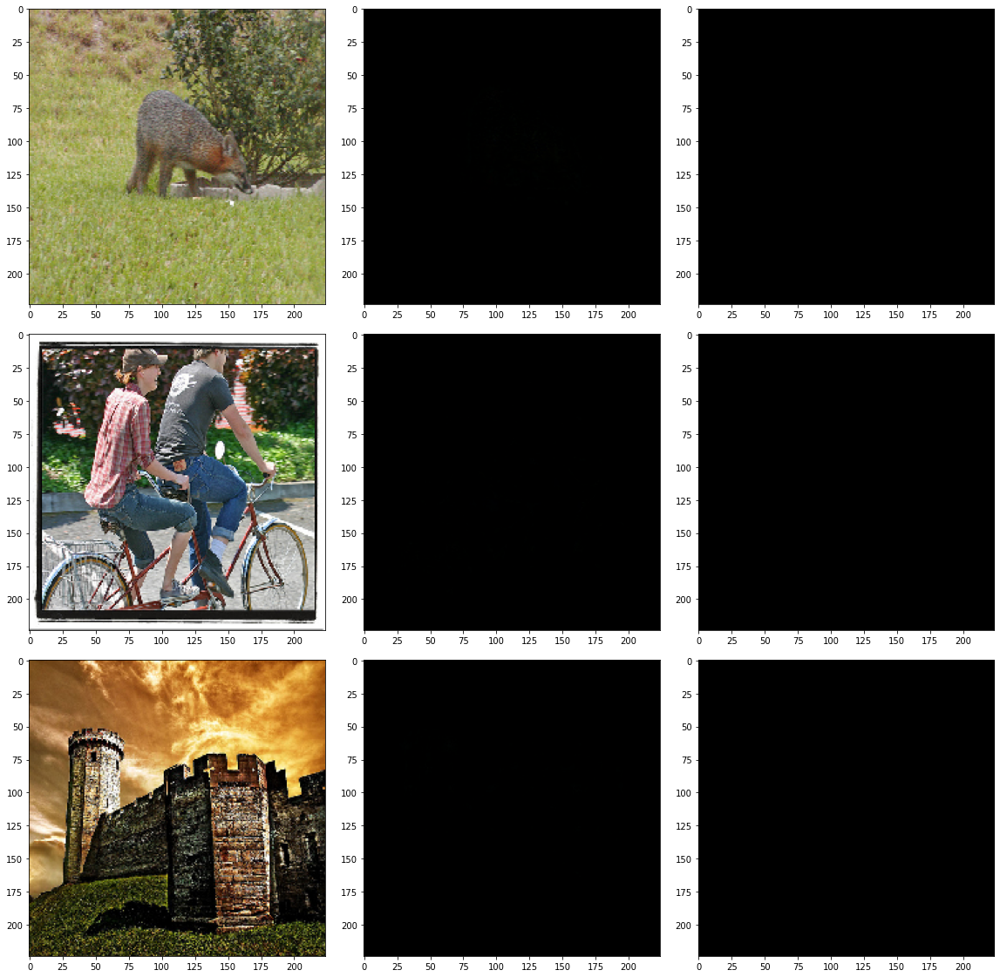

In [16]:
# fig, axs = plt.subplots(2, 3, figsize=(40,40), sharex=True, sharey=True)
fig = plt.figure(figsize=(20,20))
gs = fig.add_gridspec(3, 3, hspace=0.1, wspace=0.1)
# axs = gs.subplots(sharex='col', sharey='row')
axs = gs.subplots()
for idx, tmp_output in enumerate(results):
    axs[idx, 0].imshow(input_images[idx])
    axs[idx, 1].imshow(tmp_output["data"]["input_1"]["positive"])
    axs[idx, 2].imshow(tmp_output["data"]["input_1"]["negative"])
plt.show()

## Contrast Scaled Mode

In [17]:
is_multi_input = False
mode = "contrast"
scaler = 1.0
predictions = True

results = []
for img in input_images:
    tmp_img = process_image(img)
    output = xai_request(data ,is_multi_input, mode , scaler, predictions)
    results.append(output)

<!-- 
results = [pkl.load(open(f"trials/imagenet_output/{f}.contrast_scale","rb")) for f in images]
 -->

### Output Structure

In [19]:
print_json(results[0],0)

 success --> <class 'bool'> 

 data
	 input_1
		 positive --> <class 'list'> 	 (224, 224, 3) 

		 negative --> <class 'list'> 	 (224, 224, 3) 

 network_output
	 predictions/Softmax:0 --> <class 'list'> 	 (1, 1000) 



### Output Plots

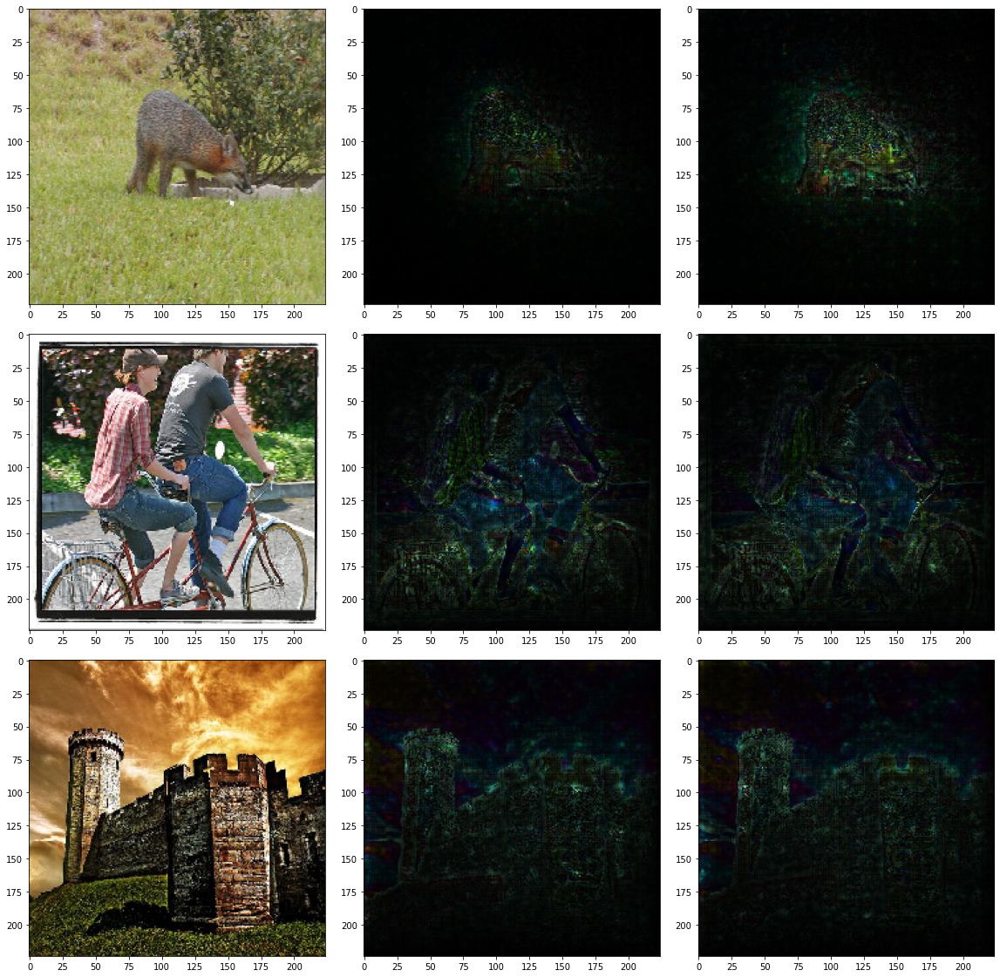

In [20]:
# fig, axs = plt.subplots(2, 3, figsize=(40,40), sharex=True, sharey=True)
fig = plt.figure(figsize=(20,20))
gs = fig.add_gridspec(3, 3, hspace=0.1, wspace=0.1)
# axs = gs.subplots(sharex='col', sharey='row')
axs = gs.subplots()
for idx, tmp_output in enumerate(results):
    axs[idx, 0].imshow(input_images[idx])
    axs[idx, 1].imshow(output_normalize(tmp_output["data"]["input_1"]["positive"]))
    axs[idx, 2].imshow(output_normalize(tmp_output["data"]["input_1"]["negative"]))
plt.show()

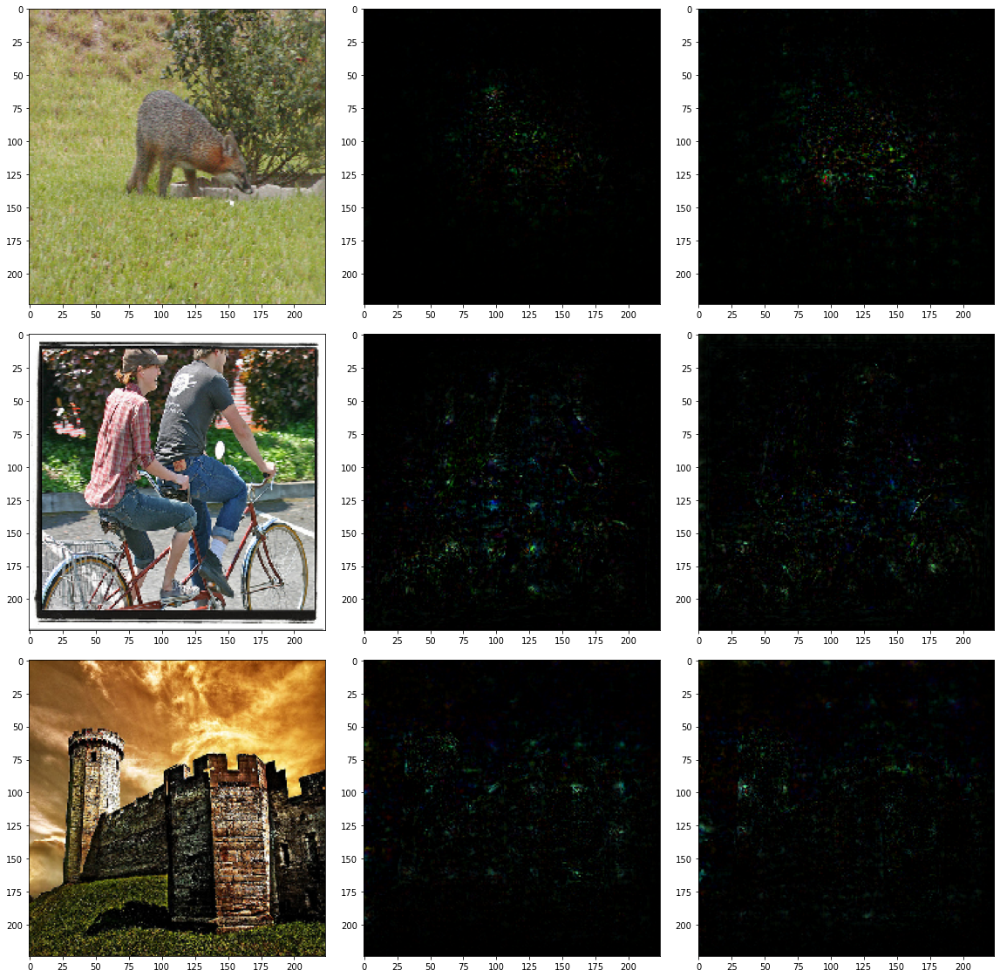

In [21]:
# fig, axs = plt.subplots(2, 3, figsize=(40,40), sharex=True, sharey=True)
fig = plt.figure(figsize=(20,20))
gs = fig.add_gridspec(3, 3, hspace=0.1, wspace=0.1)
# axs = gs.subplots(sharex='col', sharey='row')
axs = gs.subplots()
for idx, tmp_output in enumerate(results):
    axs[idx, 0].imshow(input_images[idx])
    tmp_output_diff = contrast_difference(tmp_output["data"]["input_1"])
    axs[idx, 1].imshow(output_normalize(tmp_output_diff["pos"]))
    axs[idx, 2].imshow(output_normalize(tmp_output_diff["neg"]))
plt.show()

## Validation

### We can validate the results by changing the input based on the result and observing the prediction

#### Statistics of positive and negative components

In [22]:
for idx in range(3):
    img = input_images[idx]
    input_data = process_image(img)
    positive_component = np.array(results[idx]["data"]["input_1"]["positive"])
    negative_component = np.array(results[idx]["data"]["input_1"]["negative"])

    # statistics
    pos_array = positive_component.flatten()
    pos_stats = stats.describe(pos_array)._asdict()
    pos_log_stats = stats.describe(np.log2(pos_array))._asdict()
    neg_array = negative_component.flatten()
    neg_stats = stats.describe(neg_array)._asdict()
    neg_log_stats = stats.describe(np.log2(neg_array))._asdict()
    table = []
    for k in pos_stats.keys():
        tmp_row = []
        tmp_row.append(k)
        if isinstance(pos_stats[k],tuple):
            val = "{:>10.10f}\n{:>10.10f}".format(*pos_stats[k])
        elif k!="nobs":
            val = "{:>10.10f}".format(pos_stats[k])
        else:
            val = pos_stats[k]
        tmp_row.append(val)
        if isinstance(pos_log_stats[k],tuple):
            val = "{:<10.3f}\n{:<10.3f}".format(*pos_log_stats[k])
        elif k!="nobs":
            val = "{:<10.3f}".format(pos_log_stats[k])
        else:
            val = pos_log_stats[k]
        tmp_row.append(val)
        if isinstance(neg_stats[k],tuple):
            val = "{:>10.10f}\n{:>10.10f}".format(*neg_stats[k])
        elif k!="nobs":
            val = "{:>10.10f}".format(neg_stats[k])
        else:
            val = neg_stats[k]
        tmp_row.append(val)
        if isinstance(neg_log_stats[k],tuple):
            val = "{:<10.3f}\n{:<10.3f}".format(*neg_log_stats[k])
        elif k!="nobs":
            val = "{:<10.3f}".format(neg_log_stats[k])
        else:
            val = neg_log_stats[k]
        tmp_row.append(val)
        table.append(tmp_row)
    print("\n")
    print(images[idx])
    print(tabulate.tabulate([["","Positive","Log","Negative","Log"]]+table, tablefmt='grid'))



n02120505_grey_fox
+----------+---------------+------------+---------------+------------+
|          | Positive      | Log        | Negative      | Log        |
+----------+---------------+------------+---------------+------------+
| nobs     | 150528        | 150528     | 150528        | 150528     |
+----------+---------------+------------+---------------+------------+
| minmax   | 0.0000000155  | -25.942    | 0.0000000101  | -26.567    |
|          | 0.0374750718  | -4.738     | 0.0201795362  | -5.631     |
+----------+---------------+------------+---------------+------------+
| mean     | 0.0006642254  | -11.914    | 0.0006642293  | -11.884    |
+----------+---------------+------------+---------------+------------+
| variance | 0.0000014771  | 4.437      | 0.0000013239  | 4.404      |
+----------+---------------+------------+---------------+------------+
| skewness | 5.0275992760  | -0.507     | 4.2737039140  | -0.527     |
+----------+---------------+------------+---------------

#### Distribution of positive and negative components

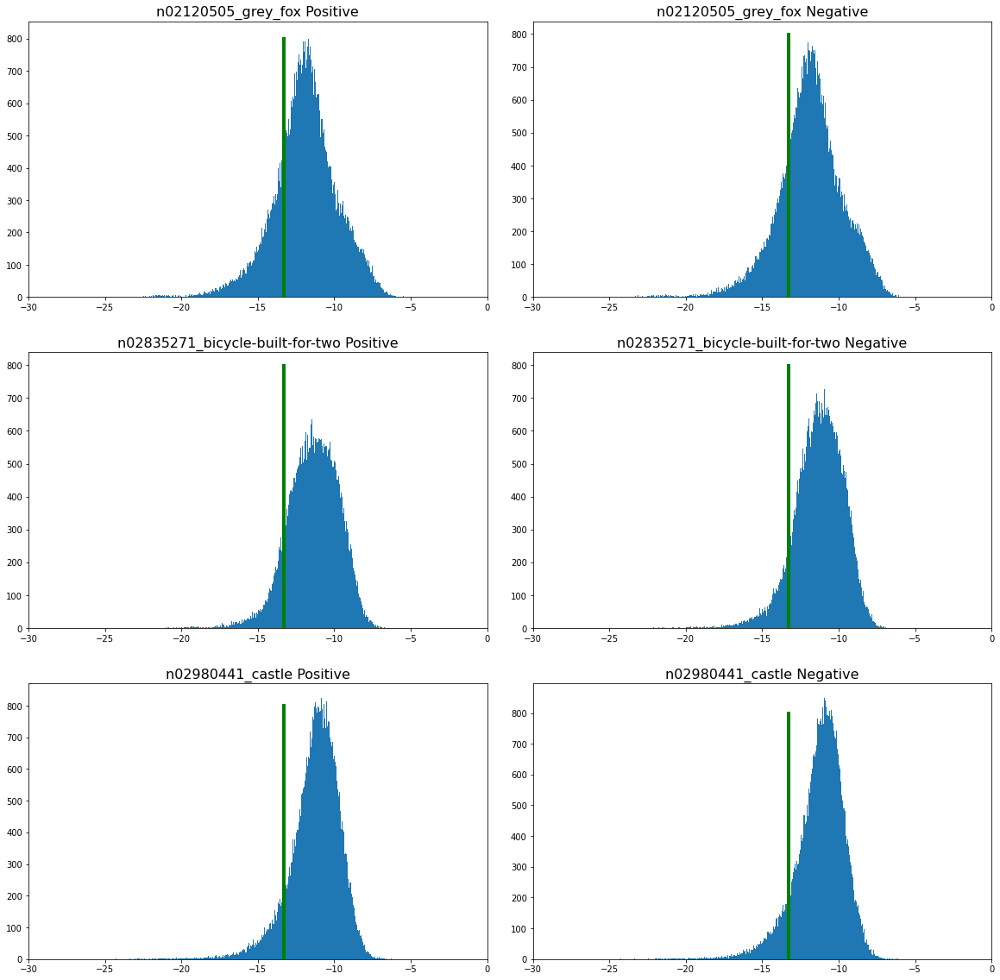

In [23]:
fig = plt.figure(figsize=(20,20))
gs = fig.add_gridspec(3, 2, hspace=0.2, wspace=0.1)
axs = gs.subplots()
thr = 0.0001
for idx in range(3):
    positive_component = np.array(results[idx]["data"]["input_1"]["positive"])
    negative_component = np.array(results[idx]["data"]["input_1"]["negative"])

    # statistics
    pos_array = positive_component.flatten()
    pos_stats = stats.describe(pos_array)._asdict()
    pos_log_stats = stats.describe(np.log2(pos_array))._asdict()
    neg_array = negative_component.flatten()
    neg_stats = stats.describe(neg_array)._asdict()
    neg_log_stats = stats.describe(np.log2(neg_array))._asdict()
    thr_data = [np.log2(thr) for i in range(800)]
    thr_y = np.arange(0,800,1)
    axs[idx,0].hist(np.log2(pos_array), bins=1000)
    axs[idx,0].plot(thr_data, thr_y, color='green', linewidth=4)
    axs[idx,0].set_xlim([-30, 0])
    axs[idx,0].set_title(f"{images[idx]} Positive",fontsize=16)
    axs[idx,1].hist(np.log2(neg_array), bins=1000)
    axs[idx,1].plot(thr_data, thr_y, color='green', linewidth=4)
    axs[idx,1].set_xlim([-30, 0])
    axs[idx,1].set_title(f"{images[idx]} Negative",fontsize=16)
plt.show()


### Testing by removing pixels

In [24]:
idx = 1
thr = 0.0001

img = input_images[idx]
img_array = image.img_to_array(img)
input_data = process_image(img)
positive_component = np.array(results[idx]["data"]["input_1"]["positive"])
negative_component = np.array(results[idx]["data"]["input_1"]["negative"])
default_component = np.array(results_default[idx]["data"]["input_1"])
pred = model.predict(input_data)

#### Switching off pixels with low positive and low negative components

In [25]:
table = []
table.append(["Number of non-zero pixels in input                       ",np.sum(img_array>0)])
table.append(["Number of non-zero pixels in positive component below thr",np.sum(positive_component<thr)])
table.append(["Number of non-zero pixels in negative component below thr",np.sum(negative_component<thr)])
# table.append(["Overlap between positive and negative component below thr",np.sum((positive_component<thr)*(negative_component<thr))])
table.append(["Overlap between positive and negative component below thr",np.sum(((positive_component<thr)+(negative_component<thr))>0)])
table.append(["Predictions original","\n".join([str(l) for l in decode_predictions(pred)[0]])])
# print(tabulate.tabulate(table, tablefmt='grid'))
# print(positive_component.max(),positive_component.min())
# pixels_to_be_switched = ((positive_component<thr)*(negative_component<thr))
pixels_to_be_switched = ((positive_component<thr)+(negative_component<thr))>0

img_new = image.img_to_array(img)
img_new[pixels_to_be_switched] = 0
# table = []
table.append(["Number of non-zero pixels in new input                    ",np.sum(img_new>0)])
table.append(["Sum of switched-off pixels in default output              ",np.sum(default_component[pixels_to_be_switched])])
network_input = process_image_array(img_new)
new_out = model.predict(network_input)
table.append(["Predictions new","\n".join([str(l) for l in decode_predictions(new_out)[0]])])
print(tabulate.tabulate(table, tablefmt='grid'))

+-----------------------------------------------------------+---------------------------------------------------+
| Number of non-zero pixels in input                        | 149890                                            |
+-----------------------------------------------------------+---------------------------------------------------+
| Number of non-zero pixels in positive component below thr | 17772                                             |
+-----------------------------------------------------------+---------------------------------------------------+
| Number of non-zero pixels in negative component below thr | 15144                                             |
+-----------------------------------------------------------+---------------------------------------------------+
| Overlap between positive and negative component below thr | 21874                                             |
+-----------------------------------------------------------+---------------------------

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


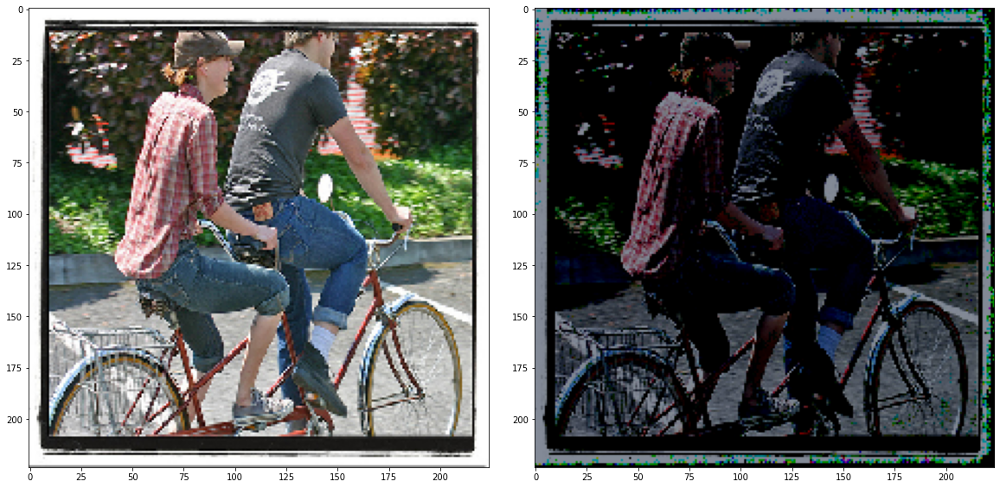

In [26]:
fig = plt.figure(figsize=(20,20))
gs = fig.add_gridspec(1, 2, hspace=0.1, wspace=0.1)
# axs = gs.subplots(sharex='col', sharey='row')
axs = gs.subplots()
axs[0].imshow(img)
axs[1].imshow(img_new.astype(np.int32))
plt.show()

#### Switching off pixels with high positive and low negative components

In [27]:
table = []
table.append(["Number of non-zero pixels in input                       ",np.sum(img_array>0)])
table.append(["Number of non-zero pixels in positive component above thr",np.sum(positive_component>thr)])
table.append(["Number of non-zero pixels in negative component below thr",np.sum(negative_component<thr)])
table.append(["Overlap positive above thr and negative component below thr",np.sum((positive_component>thr)*(negative_component<thr))])
table.append(["Predictions original","\n".join([str(l) for l in decode_predictions(pred)[0]])])
# print(tabulate.tabulate(table, tablefmt='grid'))
# print(positive_component.max(),positive_component.min())
pixels_to_be_switched = ((positive_component>thr)*(negative_component<thr))
img_new = image.img_to_array(img)
print(np.sum(img_new>0))
img_new[pixels_to_be_switched] = 0
# table = []
table.append(["Number of non-zero pixels in new input                    ",np.sum(img_new>0)])
table.append(["Sum of switched-off pixels in default output              ",np.sum(default_component[pixels_to_be_switched])])
network_input = process_image_array(img_new)
new_out = model.predict(network_input)
table.append(["Predictions new","\n".join([str(l) for l in decode_predictions(new_out)[0]])])
print(tabulate.tabulate(table, tablefmt='grid'))

149890
+-------------------------------------------------------------+----------------------------------------------------+
| Number of non-zero pixels in input                          | 149890                                             |
+-------------------------------------------------------------+----------------------------------------------------+
| Number of non-zero pixels in positive component above thr   | 132756                                             |
+-------------------------------------------------------------+----------------------------------------------------+
| Number of non-zero pixels in negative component below thr   | 15144                                              |
+-------------------------------------------------------------+----------------------------------------------------+
| Overlap positive above thr and negative component below thr | 4102                                               |
+--------------------------------------------------------

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


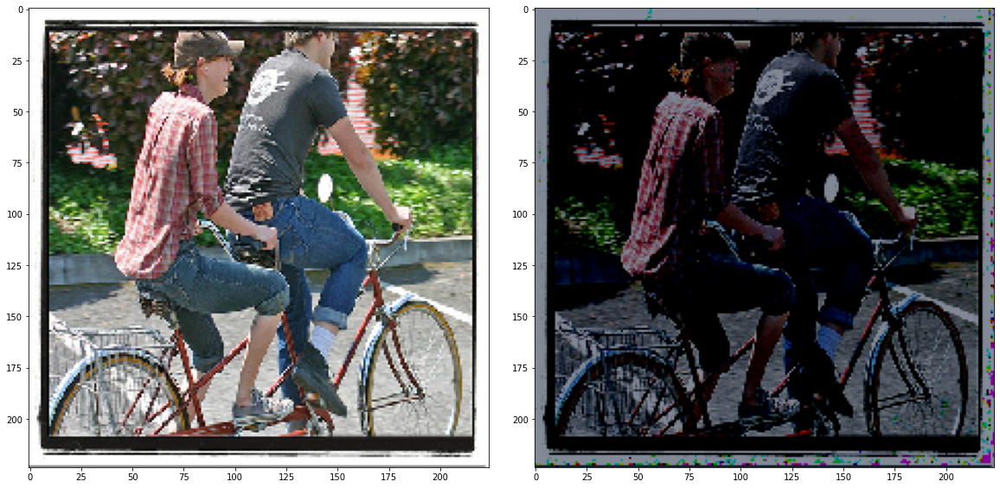

In [28]:
fig = plt.figure(figsize=(20,20))
gs = fig.add_gridspec(1, 2, hspace=0.1, wspace=0.1)
# axs = gs.subplots(sharex='col', sharey='row')
axs = gs.subplots()
axs[0].imshow(img)
axs[1].imshow(img_new.astype(np.int32))
plt.show()

#### Switching off pixels with low positive and high negative result

In [29]:
table = []
table.append(["Number of non-zero pixels in input                       ",np.sum(img_array>0)])
table.append(["Number of non-zero pixels in positive component below thr",np.sum(positive_component<thr)])
table.append(["Number of non-zero pixels in negative component above thr",np.sum(negative_component>thr)])
table.append(["Overlap positive below thr and negative component above thr",np.sum((positive_component<thr)*(negative_component>thr))])
table.append(["Predictions original","\n".join([str(l) for l in decode_predictions(pred)[0]])])
# print(tabulate.tabulate(table, tablefmt='grid'))
# print(positive_component.max(),positive_component.min())
pixels_to_be_switched = ((positive_component<thr)*(negative_component>thr))

img_new = image.img_to_array(img)
img_new[pixels_to_be_switched] = 0
# table = []
table.append(["Number of non-zero pixels in new input                    ",np.sum(img_new>0)])
table.append(["Sum of switched-off pixels in default output              ",np.sum(default_component[pixels_to_be_switched])])
network_input = process_image_array(img_new)
new_out = model.predict(network_input)
table.append(["Predictions new","\n".join([str(l) for l in decode_predictions(new_out)[0]])])
print(tabulate.tabulate(table, tablefmt='grid'))

+-------------------------------------------------------------+---------------------------------------------------+
| Number of non-zero pixels in input                          | 149890                                            |
+-------------------------------------------------------------+---------------------------------------------------+
| Number of non-zero pixels in positive component below thr   | 17772                                             |
+-------------------------------------------------------------+---------------------------------------------------+
| Number of non-zero pixels in negative component above thr   | 135384                                            |
+-------------------------------------------------------------+---------------------------------------------------+
| Overlap positive below thr and negative component above thr | 6730                                              |
+-------------------------------------------------------------+---------

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


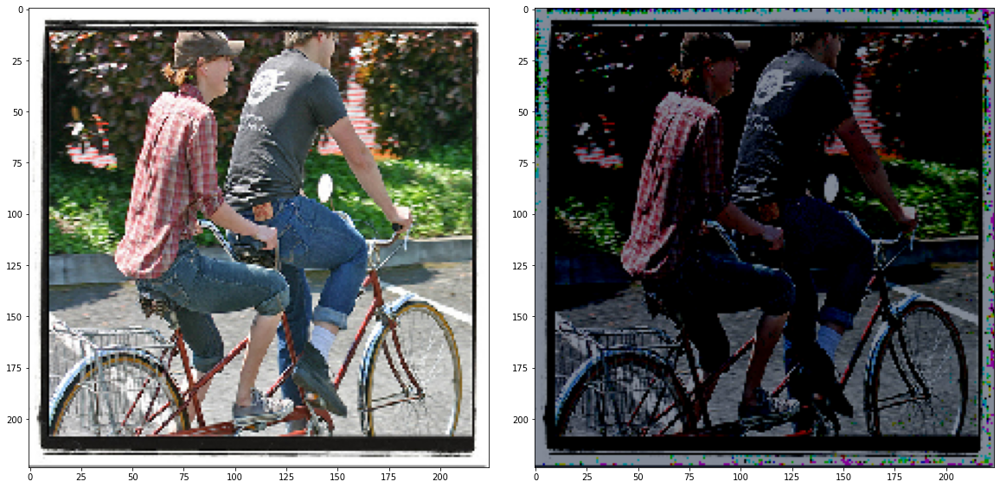

In [30]:
fig = plt.figure(figsize=(20,20))
gs = fig.add_gridspec(1, 2, hspace=0.1, wspace=0.1)
# axs = gs.subplots(sharex='col', sharey='row')
axs = gs.subplots()
axs[0].imshow(img)
axs[1].imshow(img_new.astype(np.int32))
plt.show()